### Is parameter initialisation decisive for optimisation success?

- criterion for success: NMAE obs test < 0.15


In [1]:
import sys
from pathlib import Path
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np

# from helpers import load_exp_summary
def load_exp_summary(dir_exp_output: Path):
    summary = pd.read_csv(dir_exp_output / "experiment_summary.csv")
    # drop the runs that did not finish
    summary = summary.dropna(subset=NOISE_PARAMETER_IDS)
    return summary

dir_pipeline = Path(".").resolve().parents[1]
dir_1 = dir_pipeline / "1_mechanistic_model"
dir_5 = dir_pipeline / "5_optimisation"
sys.path.append(str(dir_1))
from reference_ruoff import NOISE_PERCENTAGES, NOISE_PARAMETER_IDS

In [2]:
experiment_name_grid = "2024_07_22_Ruoff_Grid"
experiment_name_25 = "2024_08_13_Ruoff_Grid"

summary_grid = load_exp_summary(dir_5 / experiment_name_grid)
summary_25 = load_exp_summary(dir_5 / experiment_name_25)

# combine
summary = pd.concat([summary_25, summary_grid])
print(summary["noise_level"].unique())
print(summary["sparsity"].unique())

[ 5 10 20 35]
[ 25  50 100 150 200]


In [3]:
# encode successful/failed fit
target_metric = 'nmae_obs_test'
threshold = 0.1

def map_success(x:float, threshold: float):
    if np.isnan(x):
        return 0
    elif x > threshold:
        return 0
    else:
        return 1

summary["success"] = summary[target_metric].apply(lambda x: map_success(x, threshold))

print(summary["success"].value_counts())

s = summary.query("success == 1")

success
0    196181
1      1435
Name: count, dtype: int64


#### Append the initial mechanistic parameters

In [4]:
# load the mechanistic parameters

def load_ruoff_start_points(noise: int):
    fp = dir_pipeline / "3_start_points" / "ruoff_atp_consumption" / f"startpoints_lhs_noise_{noise}.csv"
    return pd.read_csv(fp)

starts = {noise: load_ruoff_start_points(noise=noise) for noise in NOISE_PERCENTAGES}

for noise in NOISE_PERCENTAGES:
    # load the parameter scales
    fp_petab_parameters = dir_pipeline / "1_mechanistic_model" / "Ruoff_BPC2003" / f"parameters_noise_{noise}.tsv"
    df_petab_measurements = pd.read_csv(fp_petab_parameters, sep="\t")
    scales_mapping = df_petab_measurements.set_index("parameterId")["parameterScale"].to_dict()
    parameters_names = list(starts[noise].columns)
    # transform the parameters to linear scale
    for parname in parameters_names:
        scale = scales_mapping[parname]
        if scale == "log10":
            starts[noise][parname] = np.log10(starts[noise][parname])
        elif scale == "lin":
            pass
        else:
            raise NotImplementedError

In [5]:
# append initial theta MM to the summary
s = s.reset_index(drop=True).drop(columns=NOISE_PARAMETER_IDS)
summary_start_points = pd.concat(
    [starts[n].iloc[i-1] for i, n in zip(s["startpoint_id"], s["noise_level"])], axis=1
).T.reset_index(drop=True)
s = pd.concat([s, summary_start_points], axis=1)

In [6]:
# get the true value and ranges
parameter_df = pd.read_csv(dir_1 / "Ruoff_BPC2003" / "parameters_noise_5.tsv", sep="\t").set_index("parameterId")
parameter_lookup = parameter_df.T.to_dict()

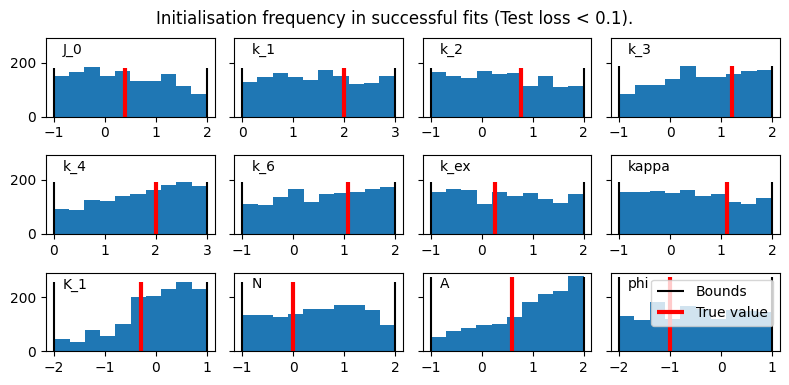

In [7]:
fig, axes = plt.subplots(nrows=3, ncols=4, sharey=True, figsize=(8, 4))

def transform(v: float, scale: str):
    if scale == "lin":
        return v
    elif scale == "log10":
        return np.log10(v)
    else:
        raise NotImplementedError

for pid, ax in zip(parameters_names, axes.flatten()):
    ax.hist(s[pid])
    ax.text(s=pid, x=0.1, y=0.8, transform=ax.transAxes)
    y_ = 0.95 * ax.get_ylim()[1]
    # lower and upper bounds
    lb = transform(parameter_lookup[pid]["lowerBound"], parameter_lookup[pid]["parameterScale"])
    ub = transform(parameter_lookup[pid]["upperBound"], parameter_lookup[pid]["parameterScale"])
    ax.vlines(lb, 0, y_, colors="k", label="Bounds")
    ax.vlines(ub, 0, y_, colors="k")
    # true value
    true = transform(parameter_lookup[pid]["nominalValue"], parameter_lookup[pid]["parameterScale"])
    ax.vlines(true, 0, y_, colors="r", linewidth=3, label="True value")
ax.legend()

fig.suptitle(f"Initialisation frequency in successful fits (Test loss < {threshold}).", y=0.95)
fig.tight_layout()
fig.savefig(f"ParameterInitialisation/histograms_threshold_{str(threshold).replace('.', '_')}_small.svg")

In [8]:
# combinations
parameters_kinetic = parameters_names[:-2]
s[parameters_kinetic]

,J_0,k_1,k_2,k_3,k_4,k_6,k_ex,kappa,K_1,N,A,phi
0,1.528887,1.472487,1.027412,1.053438,1.997386,0.711974,0.246595,-0.944809,0.297003,-0.245778,-0.836397,-0.469658
1,-0.529191,1.263850,0.597812,0.498723,2.712112,-0.305649,-0.689230,0.073598,-1.185456,1.180718,1.599021,-0.509559
2,0.488982,2.707926,1.182661,-0.307367,2.504185,-0.314502,0.675976,1.005300,-1.355053,0.619274,-0.253004,-0.302373
3,-0.122057,1.913294,0.580130,0.656536,1.383926,1.762599,0.890367,1.560805,-0.107544,0.824193,0.935954,-0.031982
4,1.412275,0.519532,-0.719269,1.251182,0.688395,-0.249471,-0.210992,-0.087129,0.699862,0.951637,0.417545,-1.910609
...,...,...,...,...,...,...,...,...,...,...,...,...
1430,1.464941,2.414038,0.838912,1.112881,2.471101,1.214324,0.320250,1.571184,-0.517954,1.469745,0.698648,-0.637241
1431,0.069957,0.084746,1.176699,1.471847,1.572707,0.349513,1.862958,1.777927,0.722197,-0.071060,1.966587,0.992080
1432,-0.248183,1.370628,1.141779,0.490144,2.248983,0.192421,0.660678,0.993467,-0.022450,0.775724,0.801291,-0.311772
1433,-0.948446,0.561504,1.693438,0.719868,1.329282,-0.688066,-0.797338,-0.150534,0.763120,-0.274211,1.086936,-0.310935


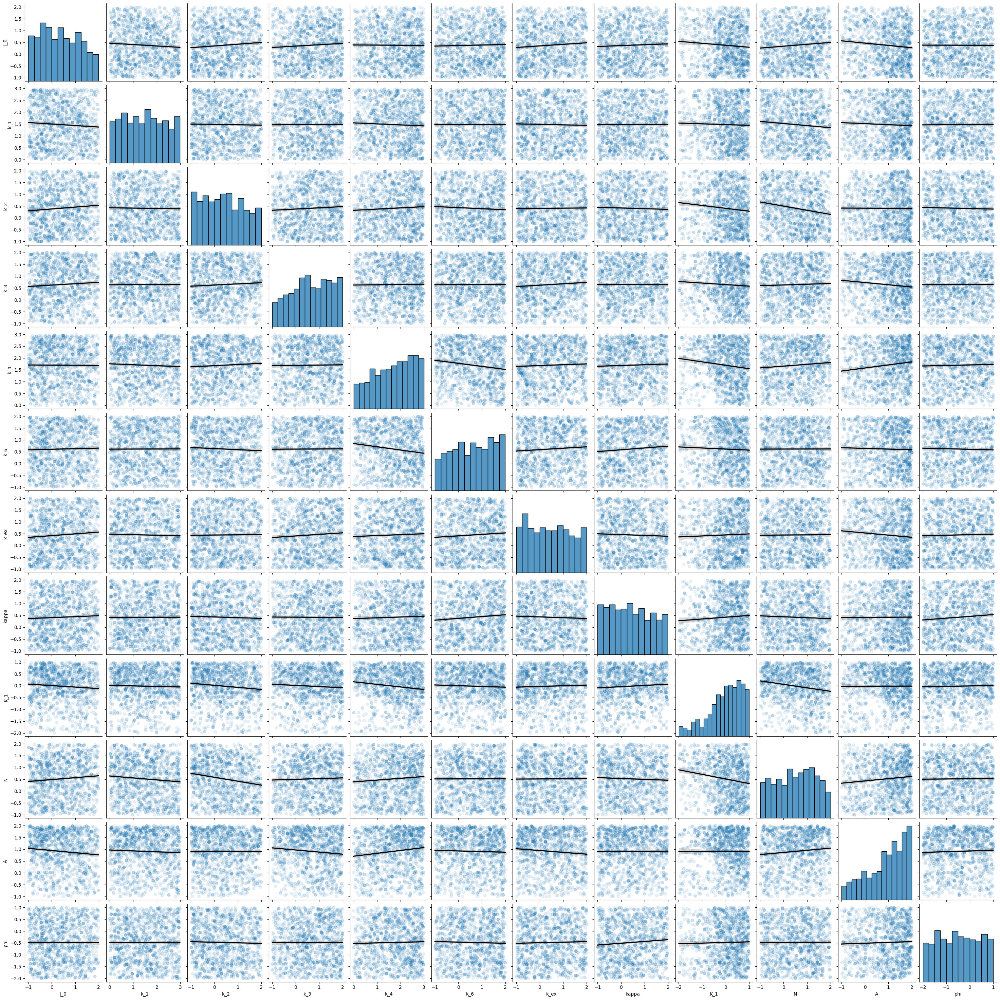

In [9]:
sns.pairplot(s[parameters_kinetic], kind="reg", plot_kws={'line_kws':{'color':'k'}, 'scatter_kws': {'alpha': 0.1}})
plt.savefig(f"ParameterInitialisation/scattermatrix_threshold_{str(threshold).replace('.', '_')}.svg")